# Load Libraries

In [116]:
import rpy2.interactive 
import rpy2.interactive.packages
%load_ext rpy2.ipython

# Directly convert objects from pandas to r and vsv
from rpy2.robjects import r, pandas2ri
pandas2ri.activate()

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use('seaborn-ticks')

#Set the global figure size
plt.rcParams['figure.figsize'] = (8.0, 8.0)

import warnings
warnings.filterwarnings('ignore')

import plotly.tools as tls
import cufflinks as cf
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected=True)

from ggplot import *

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [2]:
%%R
library(ggplot2)
library(dplyr)
library(gridExtra)
library(plotly)

# Load the Data

In [126]:
%%R
pf <-read.csv('~/Data-Science/dand/exploratory_data_analysis/lesson3/pseudo_facebook.tsv', sep='\t')
head(pf)
names(pf)
summary(pf)

     userid             age            dob_day         dob_year   
 Min.   :1000008   Min.   : 13.00   Min.   : 1.00   Min.   :1900  
 1st Qu.:1298806   1st Qu.: 20.00   1st Qu.: 7.00   1st Qu.:1963  
 Median :1596148   Median : 28.00   Median :14.00   Median :1985  
 Mean   :1597045   Mean   : 37.28   Mean   :14.53   Mean   :1976  
 3rd Qu.:1895744   3rd Qu.: 50.00   3rd Qu.:22.00   3rd Qu.:1993  
 Max.   :2193542   Max.   :113.00   Max.   :31.00   Max.   :2000  
                                                                  
   dob_month         gender          tenure        friend_count   
 Min.   : 1.000   female:40254   Min.   :   0.0   Min.   :   0.0  
 1st Qu.: 3.000   male  :58574   1st Qu.: 226.0   1st Qu.:  31.0  
 Median : 6.000   NA's  :  175   Median : 412.0   Median :  82.0  
 Mean   : 6.283                  Mean   : 537.9   Mean   : 196.4  
 3rd Qu.: 9.000                  3rd Qu.: 675.0   3rd Qu.: 206.0  
 Max.   :12.000                  Max.   :3139.0   Max.   :4923

In [5]:
%R summ <- str(pf)  

'data.frame':	99003 obs. of  15 variables:
 $ userid               : int  2094382 1192601 2083884 1203168 1733186 1524765 1136133 1680361 1365174 1712567 ...
 $ age                  : int  14 14 14 14 14 14 13 13 13 13 ...
 $ dob_day              : int  19 2 16 25 4 1 14 4 1 2 ...
 $ dob_year             : int  1999 1999 1999 1999 1999 1999 2000 2000 2000 2000 ...
 $ dob_month            : int  11 11 11 12 12 12 1 1 1 2 ...
 $ gender               : Factor w/ 2 levels "female","male": 2 1 2 1 2 2 2 1 2 2 ...
 $ tenure               : int  266 6 13 93 82 15 12 0 81 171 ...
 $ friend_count         : int  0 0 0 0 0 0 0 0 0 0 ...
 $ friendships_initiated: int  0 0 0 0 0 0 0 0 0 0 ...
 $ likes                : int  0 0 0 0 0 0 0 0 0 0 ...
 $ likes_received       : int  0 0 0 0 0 0 0 0 0 0 ...
 $ mobile_likes         : int  0 0 0 0 0 0 0 0 0 0 ...
 $ mobile_likes_received: int  0 0 0 0 0 0 0 0 0 0 ...
 $ www_likes            : int  0 0 0 0 0 0 0 0 0 0 ...
 $ www_likes_received   : int  0 0 0

Trying to capture the  output of str in R but it does not work

In [6]:
%R summ

In [127]:
pf = pd.read_csv('~/Data-Science/dand/exploratory_data_analysis/lesson3/pseudo_facebook.tsv', sep='\t')
pf.head()

,userid,age,dob_day,dob_year,dob_month,gender,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received
0,2094382,14,19,1999,11,male,266.0,0,0,0,0,0,0,0,0
1,1192601,14,2,1999,11,female,6.0,0,0,0,0,0,0,0,0
2,2083884,14,16,1999,11,male,13.0,0,0,0,0,0,0,0,0
3,1203168,14,25,1999,12,female,93.0,0,0,0,0,0,0,0,0
4,1733186,14,4,1999,12,male,82.0,0,0,0,0,0,0,0,0


In [8]:
pf.describe()

,userid,age,dob_day,dob_year,dob_month,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received
count,9.900300e+04,99003.000000,99003.000000,99003.000000,99003.000000,99001.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000
mean,1.597045e+06,37.280224,14.530408,1975.719776,6.283365,537.887375,196.350787,107.452471,156.078785,142.689363,106.116300,84.120491,49.962425,58.568831
std,3.440592e+05,22.589748,9.015606,22.589748,3.529672,457.649874,387.304229,188.786951,572.280681,1387.919613,445.252985,839.889444,285.560152,601.416348
min,1.000008e+06,13.000000,1.000000,1900.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.298806e+06,20.000000,7.000000,1963.000000,3.000000,226.000000,31.000000,17.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,1.596148e+06,28.000000,14.000000,1985.000000,6.000000,412.000000,82.000000,46.000000,11.000000,8.000000,4.000000,4.000000,0.000000,2.000000
75%,1.895744e+06,50.000000,22.000000,1993.000000,9.000000,675.000000,206.000000,117.000000,81.000000,59.000000,46.000000,33.000000,7.000000,20.000000
max,2.193542e+06,113.000000,31.000000,2000.000000,12.000000,3139.000000,4923.000000,4144.000000,25111.000000,261197.000000,25111.000000,138561.000000,14865.000000,129953.000000


## What would I do if I wanted to pass the dataframe to R and use some of it's reporting features?

It is not really possible to transfer efficient objects form python to R. It only works from R->python  
the solution is to save to disk and have R read it from there. 
Let's give it a try

In [9]:
tpf = pf.copy()
tpf.to_csv('tpf', index=False)

In [10]:
%%R
tpf <-read.csv('tpf', header=TRUE, sep=",", dec=",")

In [11]:
%%R
str(tpf)

'data.frame':	99003 obs. of  15 variables:
 $ userid               : int  2094382 1192601 2083884 1203168 1733186 1524765 1136133 1680361 1365174 1712567 ...
 $ age                  : int  14 14 14 14 14 14 13 13 13 13 ...
 $ dob_day              : int  19 2 16 25 4 1 14 4 1 2 ...
 $ dob_year             : int  1999 1999 1999 1999 1999 1999 2000 2000 2000 2000 ...
 $ dob_month            : int  11 11 11 12 12 12 1 1 1 2 ...
 $ gender               : Factor w/ 3 levels "","female","male": 3 2 3 2 3 3 3 2 3 3 ...
 $ tenure               : Factor w/ 2427 levels "","0.0","1.0",..: 1601 1984 337 2351 2229 559 226 2 2218 793 ...
 $ friend_count         : int  0 0 0 0 0 0 0 0 0 0 ...
 $ friendships_initiated: int  0 0 0 0 0 0 0 0 0 0 ...
 $ likes                : int  0 0 0 0 0 0 0 0 0 0 ...
 $ likes_received       : int  0 0 0 0 0 0 0 0 0 0 ...
 $ mobile_likes         : int  0 0 0 0 0 0 0 0 0 0 ...
 $ mobile_likes_received: int  0 0 0 0 0 0 0 0 0 0 ...
 $ www_likes            : int  0 0 0 0 

In [12]:
%ls

Bivariate_EDA.ipynb                        README.md
Bivariate_EDA_Problem_Set.ipynb            r-plot.html
LICENSE                                    subplots.html
Multivariate_EDA_Lessons+ProblemSet.ipynb  tpf
osm.html                                   tpf.csv
R-Conda -Notebook_plotly_examples.ipynb


# Simple Histogram

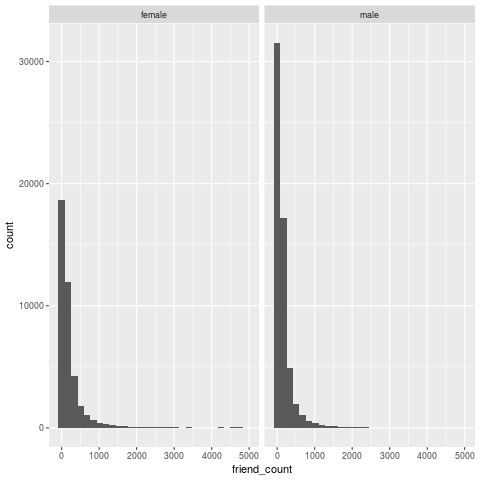

In [13]:
%%R
ggplot(aes(x = friend_count, color=age),
       data = subset(pf, !is.na(gender))) + geom_histogram() +
facet_wrap(~gender, ncol=2)

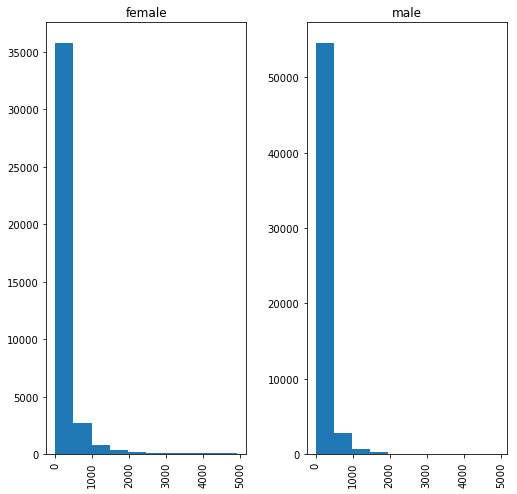

In [14]:
pf.hist(column='friend_count', by='gender');

# Third Qualitative Variable

## Boxplots

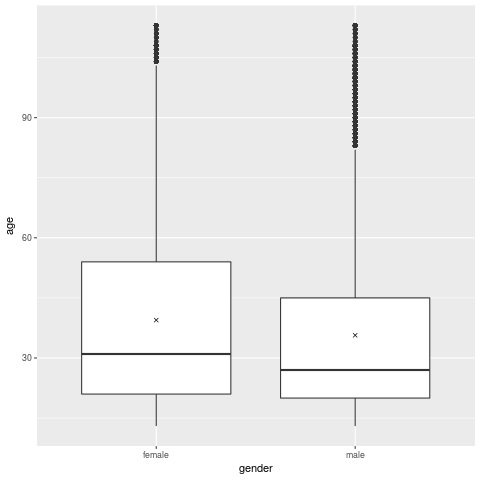

In [15]:
%%R
# Make two boxplots
ggplot(aes(x = gender, y = age),
       data = subset(pf, !is.na(gender))) + 
  geom_boxplot() +
  #add the mean as an x (shape = 4)
  stat_summary(fun.y = mean, geom = 'point', shape = 4)

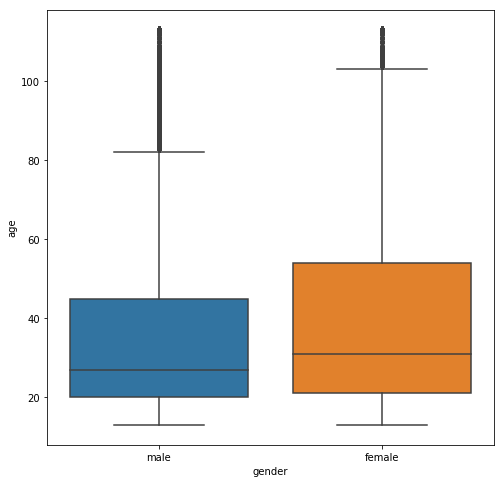

In [16]:
sns.boxplot(x='gender', y='age', data=pf);

## Lineplots

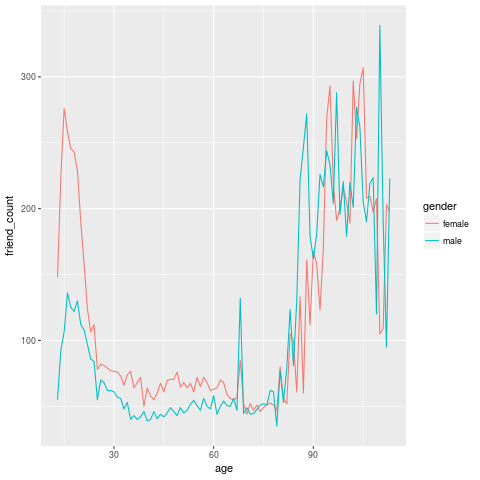

In [17]:
%%R
# Make a lineplot
ggplot(aes(x = age, y = friend_count),
       data = subset(pf, !is.na(gender))) + 
  geom_line(aes(color=gender), stat = 'summary', fun.y = median) 

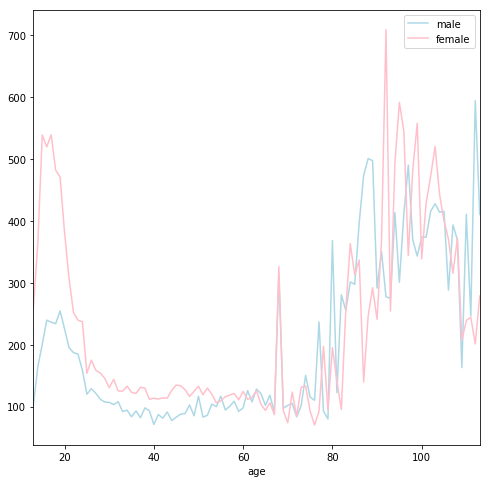

In [18]:
fig, ax = plt.subplots(1)

pf[pf.gender=='male'].groupby('age').friend_count.mean().plot.line(x='age', y='friend_count', ax=ax, color='lightblue')
pf[pf.gender=='female'].groupby('age').friend_count.mean().plot.line(x='age', y='friend_count', ax=ax, color='pink')
ax.legend(('male', 'female'));

## Summarizing on a third variable

  Write code to create a new data frame,
  called 'pf.fc_by_age_gender', that contains
  information on each age AND gender group.

  The data frame should contain the following variables:

     mean_friend_count,
     median_friend_count,
     n (the number of users in each age and gender grouping)

  Here is an example of the structure of your data frame. Your
  data values will be different. Note that if you are grouping by
  more than one variable, you will probably need to call the
  ungroup() function. 

    age gender mean_friend_count median_friend_count    n
  1  13 female          247.2953                 150  207
  2  13   male          184.2342                  61  265
  3  14 female          329.1938                 245  834
  4  14   male          157.1204                  88 1201

In [128]:
%%R
pf.fc_by_age_gender <- group_by(subset(pf, !is.na(gender)), age, gender)

pf.fc_by_age_gender <- summarise(pf.fc_by_age_gender,
                                mean_friend_count = mean(friend_count),
                                median_friend_count = median(friend_count),
                                n = n())
#pf.fc_by_age_gender = ungroup(pf.fc_by_age_gender)
pf.fc_by_age_gender

# A tibble: 202 x 5
# Groups:   age [?]
     age gender mean_friend_count median_friend_count     n
   <int> <fctr>             <dbl>               <dbl> <int>
 1    13 female          259.1606               148.0   193
 2    13   male          102.1340                55.0   291
 3    14 female          362.4286               224.0   847
 4    14   male          164.1456                92.5  1078
 5    15 female          538.6813               276.0  1139
 6    15   male          200.6658               106.5  1478
 7    16 female          519.5145               258.5  1238
 8    16   male          239.6748               136.0  1848
 9    17 female          538.9943               245.5  1236
10    17   male          236.4924               125.0  2045
# ... with 192 more rows


### Alternative with chained commands

In [129]:
%%R
pf.fc_by_age_gender <- pf %>%
  filter(!is.na(gender)) %>%
  group_by(age, gender) %>%
  summarise(mean_friend_count = mean(friend_count),
            median_friend_count = median(friend_count),
            n()) 
 # ungroup() It looks like it is not necessary

pf.fc_by_age_gender 

# A tibble: 202 x 5
# Groups:   age [?]
     age gender mean_friend_count median_friend_count `n()`
   <int> <fctr>             <dbl>               <dbl> <int>
 1    13 female          259.1606               148.0   193
 2    13   male          102.1340                55.0   291
 3    14 female          362.4286               224.0   847
 4    14   male          164.1456                92.5  1078
 5    15 female          538.6813               276.0  1139
 6    15   male          200.6658               106.5  1478
 7    16 female          519.5145               258.5  1238
 8    16   male          239.6748               136.0  1848
 9    17 female          538.9943               245.5  1236
10    17   male          236.4924               125.0  2045
# ... with 192 more rows


In [130]:
# In Pandas - I found a way to name the columns directly
pf_grouped = pf.groupby(['age', 'gender'])
pf_fc_by_age_gender = pf_grouped.friend_count.agg({'mean_friend_count': np.mean,
                                                   'median_friend_count': np.median,
                                                    'n': len})
pf_fc_by_age_gender.head()

mean_friend_count  median_friend_count     n
age gender                                              
13  female         259.160622                148.0   193
    male           102.134021                 55.0   291
14  female         362.428571                224.0   847
    male           164.145640                 92.5  1078
15  female         538.681299                276.0  1139

## Plot the line plot

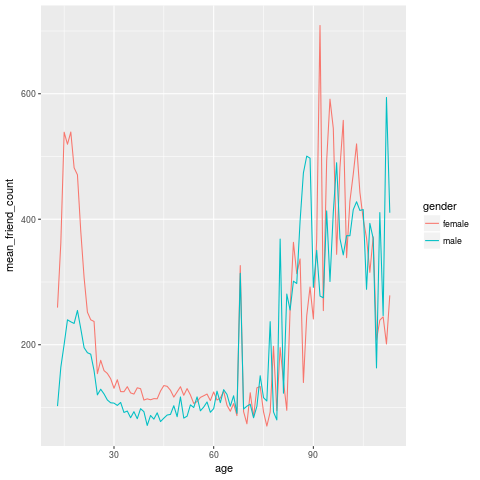

In [22]:
%%R
ggplot(aes(x=age, y=mean_friend_count, color = gender), data = pf.fc_by_age_gender) + 
  geom_line()

In [23]:
pf_fc_by_age_gender.index.levels[1]

Index(['female', 'male'], dtype='object', name='gender')

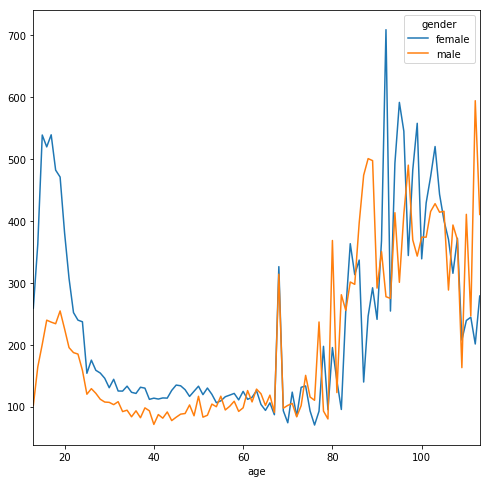

In [24]:
#Pandas - The gender subindex has to be unstacked first
ax = pf_fc_by_age_gender.mean_friend_count.unstack(level=1).plot(subplots=False)

In [102]:
# And this is how it looks unstacked 
pf_fc_by_age_gender.mean_friend_count.unstack(level=1).head() 

gender,female,male
age,,
13,259.160622,102.134021
14,362.428571,164.145640
15,538.681299,200.665765
16,519.514540,239.674784
17,538.994337,236.492421


# Reshaping Data

In [131]:
%%R
library(reshape2)
pf.fc_by_age_gender.wide <- dcast(pf.fc_by_age_gender,
                                  age ~ gender,
                                  value.var = 'median_friend_count')
head(pf.fc_by_age_gender.wide)

  age female  male
1  13  148.0  55.0
2  14  224.0  92.5
3  15  276.0 106.5
4  16  258.5 136.0
5  17  245.5 125.0
6  18  243.0 122.0


In [104]:
# Pivot_table aggregates with mean as default
pf.pivot_table(index='age', columns='gender', values='friend_count', aggfunc=np.median).head() 

gender,female,male
age,,
13,148.0,55.0
14,224.0,92.5
15,276.0,106.5
16,258.5,136.0
17,245.5,125.0


In [105]:
#It is possible to do this with crosstab as well
pd.crosstab(pf.age, pf.gender, values=pf.friend_count, aggfunc=np.median).head()
# Note that we start at the original dataframe here

gender,female,male
age,,
13,148.0,55.0
14,224.0,92.5
15,276.0,106.5
16,258.5,136.0
17,245.5,125.0


## Ratio Plot

  Plot the ratio of the female to male median
  friend counts using the data frame
  pf.fc_by_age_gender.wide.

  Think about what geom you should use.
  Add a horizontal line to the plot with
  a y intercept of 1, which will be the
  base line. Look up the documentation
  for geom_hline to do that. Use the parameter
  linetype in geom_hline to make the
  line dashed.

  The linetype parameter can take the values 0-6:
  0 = blank, 1 = solid, 2 = dashed
  3 = dotted, 4 = dotdash, 5 = longdash
  6 = twodash

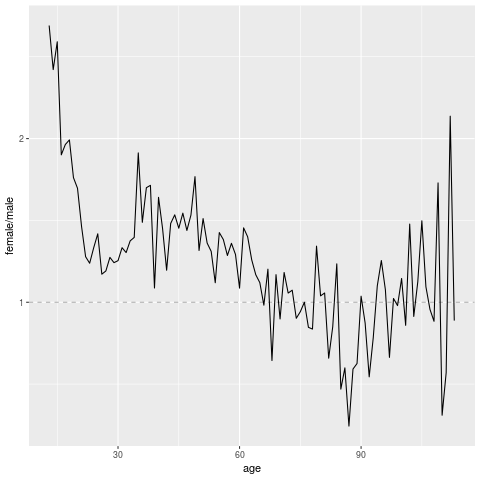

In [29]:
%%R
ggplot(aes(x = age, y = female/male), data = pf.fc_by_age_gender.wide) + 
  geom_line() + 
  #create a reference line over at 1 
  geom_hline(yintercept = 1, alpha = 0.3, linetype = 2)

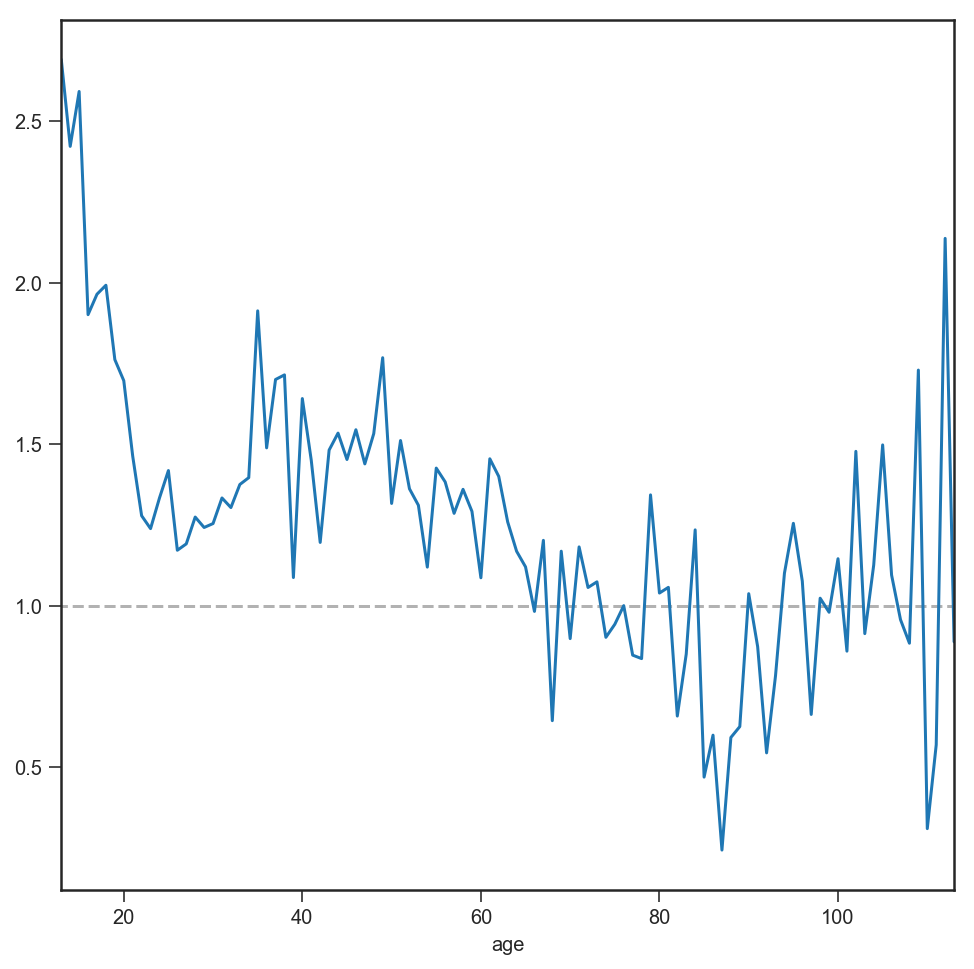

In [132]:
#Pandas
pf_wide = pd.crosstab(pf.age, pf.gender, values=pf.friend_count, aggfunc=np.median)

#Let's try dividing it directly
ax = (pf_wide.female/pf_wide.male).plot()
#plot an intercept line
ax.hlines(y=1,xmin=0, xmax=150, linestyles='dashed', alpha=0.3 ); 

#    Third Quantitative Variable

  Create a variable called year_joined
  in the pf data frame using the variable
  tenure and 2014 as the reference year.

  The variable year joined should contain the year
  that a user joined facebook.

In [133]:
%%R
pf$year_joined  <- floor(2014 - pf$tenure/360)
head(pf)

   userid age dob_day dob_year dob_month gender tenure friend_count
1 2094382  14      19     1999        11   male    266            0
2 1192601  14       2     1999        11 female      6            0
3 2083884  14      16     1999        11   male     13            0
4 1203168  14      25     1999        12 female     93            0
5 1733186  14       4     1999        12   male     82            0
6 1524765  14       1     1999        12   male     15            0
  friendships_initiated likes likes_received mobile_likes mobile_likes_received
1                     0     0              0            0                     0
2                     0     0              0            0                     0
3                     0     0              0            0                     0
4                     0     0              0            0                     0
5                     0     0              0            0                     0
6                     0     0              0

In [134]:
#Pandas
pf['year_joined'] = np.floor(2014 - pf.tenure/360)
#make it an integer - it can not be done, see: https://pandas.pydata.org/pandas-docs/stable/gotchas.html
pf.loc[~pf.year_joined.isnull(), 'year_joined'] = pf.year_joined[~pf.year_joined.isnull()].astype(int)
pf.head()

,userid,age,dob_day,dob_year,dob_month,gender,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received,year_joined
0,2094382,14,19,1999,11,male,266.0,0,0,0,0,0,0,0,0,2013.0
1,1192601,14,2,1999,11,female,6.0,0,0,0,0,0,0,0,0,2013.0
2,2083884,14,16,1999,11,male,13.0,0,0,0,0,0,0,0,0,2013.0
3,1203168,14,25,1999,12,female,93.0,0,0,0,0,0,0,0,0,2013.0
4,1733186,14,4,1999,12,male,82.0,0,0,0,0,0,0,0,0,2013.0


# Cut a Variable

In [33]:
%%R
summary(pf$year_joined)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   2005    2012    2012    2012    2013    2014       2 


In [34]:
pf.year_joined.describe()

count    99001.000000
mean      2011.981758
std          1.273550
min       2005.000000
25%       2012.000000
50%       2012.000000
75%       2013.000000
max       2014.000000
Name: year_joined, dtype: float64

In [35]:
%%R
#get the count per year
table(pf$year_joined)


 2005  2006  2007  2008  2009  2010  2011  2012  2013  2014 
   10    18   663  1644  4612  5461 10037 33568 42918    70 


In [36]:
#Pandas
table = pf.year_joined.value_counts().sort_index()
table

2005.0       10
2006.0       18
2007.0      663
2008.0     1644
2009.0     4612
2010.0     5461
2011.0    10037
2012.0    33568
2013.0    42918
2014.0       70
Name: year_joined, dtype: int64

  Create a new variable in the data frame
  called year_joined.bucket by using
  the cut function on the variable year_joined.

  You need to create the following buckets for the
  new variable, year_joined.bucket

         (2004, 2009]
         (2009, 2011]
         (2011, 2012]
         (2012, 2014]

  Note that a parenthesis means exclude the year and a
  bracket means include the year.

In [135]:
%%R
pf$year_joined.bucket = cut(pf$year_joined, c(2004, 2009, 2011, 2012, 2014)) 
table(pf$year_joined.bucket)


(2004,2009] (2009,2011] (2011,2012] (2012,2014] 
       6947       15498       33568       42988 


In [136]:
#pandas
pf['year_joined_bucket'] = pd.cut(pf.year_joined, (2004, 2009, 2011, 2012, 2014))
pf.year_joined_bucket.value_counts(sort=False)

(2004, 2009]     6947
(2009, 2011]    15498
(2011, 2012]    33568
(2012, 2014]    42988
Name: year_joined_bucket, dtype: int64

# Checking out the bqplot interactivity

In [39]:
from bqplot import pyplot as plt
from bqplot import *

In [40]:
pf_age_ratio = pf_wide.female/pf_wide.male

In [41]:
tp = Tooltip(fields = (list(pf_age_ratio.index), list(pf_age_ratio)), labels=['y', 'x'] )
plt.plot(pf_age_ratio, tooltip=tp)
plt.show()

Widget Javascript not detected.  It may not be installed or enabled properly.


# And plotly

### With a widget!

In [43]:
# Create a trace
trace = go.Scatter(
    x = pf_age_ratio.index,
    y = pf_age_ratio,
    name='Gender Ratio',
#     text='age',
    hoverinfo = 'all'
)

data = [trace]

layout = dict(
    title='Line Plot with range slider and selectors',
    xaxis=dict(
        rangeslider=dict(),
        ),
shapes= [
        # Line Horizontal
        {
            'type': 'line',
            'x0': 0,
            'y0': 1,
            'x1': pf_age_ratio.index.max(),
            'y1': 1,
            'line': {
                'color': 'black',
                'width': 0.8,
                'dash': 'dash',
            }}
            ]
    )

fig = dict(data=data, layout=layout)

plotly.offline.iplot(fig)

##    Plotting it All Together

  Create a line graph of friend_count vs. age
  so that each year_joined.bucket is a line
  tracking the median user friend_count across
  age. This means you should have four different
  lines on your plot.

  You should subset the data to exclude the users
  whose year_joined.bucket is NA.

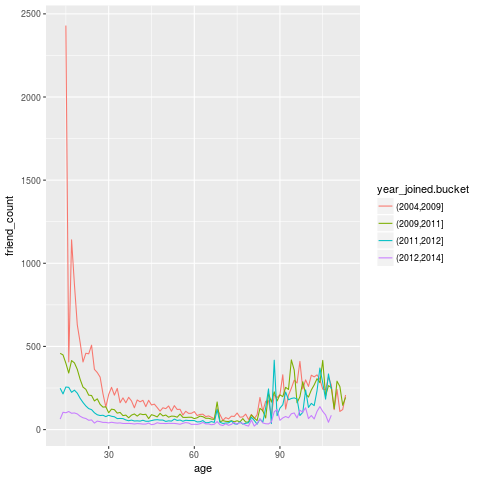

In [44]:
%%R
ggplot(aes(x=age, y=friend_count), data=subset(pf,!is.na(pf$year_joined.bucket))) +
  geom_line(aes(color=year_joined.bucket), stat = 'summary', fun.y = median)

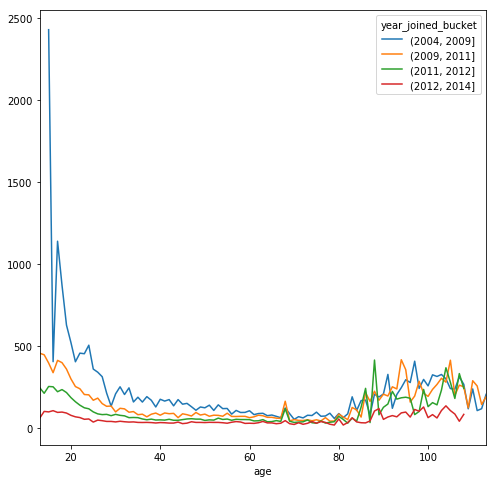

In [45]:
#pandas - The best way is by  using pivot_table
pf.pivot_table(index='age', columns='year_joined_bucket', values='friend_count', aggfunc='median').plot();

In [108]:
#let's take a look at the table
pf.pivot_table(index='age', columns='year_joined_bucket', values='friend_count', aggfunc='median').head()

year_joined_bucket,"(2004, 2009]","(2009, 2011]","(2011, 2012]","(2012, 2014]",nan
age,,,,,
13,NaN,458.5,248.5,63.0,NaN
14,NaN,449.0,214.5,104.0,NaN
15,2430.0,399.0,256.0,101.0,NaN
16,407.0,340.0,254.0,108.5,NaN
17,1141.0,415.0,224.0,98.0,NaN


In [47]:
pfg = pf.pivot_table(index='age', columns='year_joined_bucket', values='friend_count', aggfunc='median')
pfg.columns

CategoricalIndex([(2004, 2009], (2009, 2011], (2011, 2012], (2012, 2014]], categories=[(2004, 2009], (2009, 2011], (2011, 2012], (2012, 2014]], ordered=True, name='year_joined_bucket', dtype='category')

In [48]:
pfg.columns[0]

Interval(2004, 2009, closed='right')

### Use Plotly's Native Syntax

In [49]:
# Create and style traces
trace0 = go.Scatter(
    x = pfg.index,
    y = pfg[pfg.columns[0]],
    name = str(pfg.columns[0]),
    line = dict(
        color = ('blue'),
        width = 1)
)
trace1 = go.Scatter(
    x = pfg.index,
    y = pfg[pfg.columns[1]],
    name = str(pfg.columns[1]),
    line = dict(
        color = ('green'),
        width = 1)
)
trace2 = go.Scatter(
    x = pfg.index,
    y = pfg[pfg.columns[2]],
    name = str(pfg.columns[2]),
    line = dict(
        color = ('red'),
        width = 1)
)
trace3 = go.Scatter(
    x = pfg.index,
    y = pfg[pfg.columns[3]],
    name = str(pfg.columns[3]),
    line = dict(
        color = ('purple'),
        width = 1)
)
data = [trace0, trace1, trace2, trace3]

# Edit the layout
layout = dict(title = 'Median friend count per year_joined_bucket',
              xaxis = dict(title = 'Age'),
              yaxis = dict(title = 'Friend count')
              )

fig = dict(data=data, layout=layout)

#Use plot instead of iplot if you want to save the html file
plotly.offline.iplot(fig, show_link=False)

### Use Plotly' Python Syntax

In [50]:
# A simpler Alternative
plotly.offline.iplot([{
                        'x': pfg.index,
                        'y': pfg[col],
                        'name': str(col)
                    }  for col in pfg.columns], show_link=False, filename='plot.html')

### Use Plotly cufflinks

In [52]:
#That works pretty well too
pfg.iplot(theme='white', colorscale='set2', fill=False)

In [53]:
#Subplots!
pfg.iplot(subplots=True, offline_show_link=False, filename='subplots.html')

In [54]:
#Get cufflink themes
cf.colors.scales()

### Save the cufflinks chart as html

In [55]:
fig = pfg.iplot(subplots=True, offline_show_link=False, asFigure=True )
plotly.offline.plot(fig,filename='subplots.html')

'file:///home/jkb/Data-Science/GitHub/EDA_in_R_and_Python/subplots.html'

### Matplotib - plotly

In [56]:
#Check out the matplotlib option - good but nes  tweaking to work properly
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1)

pf[pf.gender=='male'].groupby('age').friend_count.mean().plot.line(x='age', y='friend_count', ax=ax, color='lightblue')
pf[pf.gender=='female'].groupby('age').friend_count.mean().plot.line(x='age', y='friend_count', ax=ax, color='pink')
ax.legend(('male', 'female'))
plotly.offline.iplot_mpl(fig, resize=True, strip_style=True)

In [57]:
#how is it doing with seaborn? Does not work very well
fig = sns.boxplot(x='gender', y='age', data=pf).get_figure()
plotly.offline.iplot_mpl(fig);

##    Plot the Grand Mean

  Write code to do the following:

  (1) Add another geom_line to code below
  to plot the grand mean of the friend count vs age.

  (2) Exclude any users whose year_joined.bucket is NA.

  (3) Use a different line type for the grand mean.

  As a reminder, the parameter linetype can take the values 0-6:

  0 = blank, 1 = solid, 2 = dashed
  3 = dotted, 4 = dotdash, 5 = longdash
  6 = twodash

In [58]:
%%R
#Plot
p= ggplot(aes(x=age, y=friend_count), data=subset(pf,!is.na(pf$year_joined.bucket))) +
  geom_line(aes(color=year_joined.bucket), stat = 'summary', fun.y = mean) + 
  geom_line(aes(),linetype = 4, stat = 'summary', fun.y=mean) +
  theme_light()

#transform to plotly object
p = ggplotly(p)

#save as html
htmlwidgets::saveWidget(as.widget(p), "r-plot.html")

### You can display the R plotly plots by saving them and showing them as iframes

In [59]:
from IPython.display import IFrame
IFrame('r-plot.html', width=800, height=600)

## Friending Rate
What is the median friend rate?

What is the maximum friend rate?

In [60]:
%%R
s = with(subset(pf, tenure >=1), summary(friend_count / tenure))
s 

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
  0.0000   0.0775   0.2205   0.6096   0.5658 417.0000 


### Trying to capture the r output again

In [61]:
%R -o s

In [62]:
s

0.000000,0.077486,0.220486,0.609609,0.565802,417.000000


### Testing df.query

In [63]:
#Pandas
pf.query('tenure>=1') == pf[pf.tenure>=1]

,userid,age,dob_day,dob_year,dob_month,gender,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received,year_joined,year_joined_bucket
0,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
1,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
2,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
3,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
4,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
5,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
6,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
8,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
9,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
10,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True


### Testing pandassql

In [64]:
from pandasql import *

In [65]:
#provide acces to the globals
pysqldf = lambda q: sqldf(q, globals())

In [67]:
%%script false
#make query
q = '''
SELECT
    *
FROM
    pf
WHERE
    pf.tenure>=1;
'''
sqldf(q, locals())

Not so simple! will come back to this

In [68]:
#let's head back to our quiz

#Have to aggregate first!
pf_ag = pf[pf.tenure>=1]

(pf_ag.friend_count/pf_ag.tenure).describe()

count    98931.000000
mean         0.609609
std          2.557356
min          0.000000
25%          0.077486
50%          0.220486
75%          0.565802
max        417.000000
dtype: float64

## Bias-Variance Tradeoff Revisited

  Create a line graph of mean of friendships_initiated per day (of tenure)
  vs. tenure colored by year_joined.bucket.

  You need to make use of the variables tenure,
  friendships_initiated, and year_joined.bucket.

  You also need to subset the data to only consider user with at least
  one day of tenure.


In [69]:
%%R
p1 <- ggplot(aes(x = tenure, y = friendships_initiated / tenure),
       data = subset(pf, tenure >= 1)) +
  geom_line(aes(color = year_joined.bucket),
            stat = 'summary',
            fun.y = mean) 


p2 <- ggplot(aes(x = 7 * round(tenure / 7), y = friendships_initiated / tenure),
       data = subset(pf, tenure > 0)) +
  geom_line(aes(color = year_joined.bucket),
            stat = "summary",show.legend = FALSE,
            fun.y = mean) 


p3 <- ggplot(aes(x = 30 * round(tenure / 30), y = friendships_initiated / tenure),
       data = subset(pf, tenure > 0)) +
  geom_line(aes(color = year_joined.bucket),
            stat = "summary",show.legend = FALSE,
            fun.y = mean)

p4 <- ggplot(aes(x = 90 * round(tenure / 90), y = friendships_initiated / tenure),
       data = subset(pf, tenure > 0)) +
  geom_line(aes(color = year_joined.bucket),
            stat = "summary",show.legend = FALSE,
            fun.y = mean) + 
  guides(line=FALSE)

    
subplot(p1, p2, p3, p4, nrows = 4)
    
sub <- subplot(p1, p2, p3, p4, nrows = 4)

htmlwidgets::saveWidget(as.widget(sub), "subplots.html")

In [70]:
IFrame('subplots.html', width=1000, height=600)

Not really what I wanted to see although the hover labels are cool. Have to find a way to show only one legend

In [71]:
#Pandas

#make a new col for the friend rate
pf_ag = pf[pf.tenure>=1]
pf['friend_rate'] = (pf_ag.friend_count/pf_ag.tenure)

#cast the special type as a string
pf['year_joined_bucket'] = pf['year_joined_bucket'].astype(str)

# Unique category labels
color_labels = pf['year_joined_bucket'].unique()

# List colors
rgb_values = ['purple','red', 'green','blue']

# Map label to RGB
color_map = dict(zip(color_labels, rgb_values))

#create color column
pf['color'] = pf['year_joined_bucket'].map(color_map)

smoothers = [1,7,30,90]
fig, axes = plt.subplots(nrows=4)

for ax, smoother in zip(axes, smoothers):
    pf1 = pf.copy()
    pf1['tenure'] = smoother * round(pf1.tenure / smoother)

    pfg = pf1.pivot_table(values='friend_rate', index='tenure', columns='color', aggfunc='mean')
    pfg.plot(ax=ax, legend=False);
    
plotly.offline.iplot_mpl(fig, resize=True, strip_style=False)

I need to fix the labels , but that ain't so bad

## Bias-Variance Tradeoff Revisited - Smooth

In [72]:
%%R
p1 <- ggplot(aes(x = tenure, y = friendships_initiated / tenure),
       data = subset(pf, tenure >= 1)) +
  geom_smooth(aes(color = year_joined.bucket))

    
p1


htmlwidgets::saveWidget(as.widget(ggplotly(p1)), "smooth.html")

In [73]:
IFrame('smooth.html', width=1000, height=600)

No real alternative to geom smooth in python - except ggplot of course - will have to fill that in here

# Introducing the Yogurt Data Set

## Histograms Revisited

In [3]:
%%R
yo <- read.csv('/home/jkb/Data-Science/dand/exploratory_data_analysis/lesson5/yogurt.csv')

#change id to a factor variable
yo$id = factor(yo$id)

In [4]:
%R str(yo)

'data.frame':	2380 obs. of  9 variables:
 $ obs        : int  1 2 3 4 5 6 7 8 9 10 ...
 $ id         : Factor w/ 332 levels "2100081","2100370",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ time       : int  9678 9697 9825 9999 10015 10029 10036 10042 10083 10091 ...
 $ strawberry : int  0 0 0 0 1 1 0 0 0 0 ...
 $ blueberry  : int  0 0 0 0 0 0 0 0 0 0 ...
 $ pina.colada: int  0 0 0 0 1 2 0 0 0 0 ...
 $ plain      : int  0 0 0 0 0 0 0 0 0 0 ...
 $ mixed.berry: int  1 1 1 1 1 1 1 1 1 1 ...
 $ price      : num  59 59 65 65 49 ...


In [5]:
%R head(yo)

,obs,id,time,strawberry,blueberry,pina.colada,plain,mixed.berry,price
1,1,2100081,9678,0,0,0,0,1,58.96
2,2,2100081,9697,0,0,0,0,1,58.96
3,3,2100081,9825,0,0,0,0,1,65.04
4,4,2100081,9999,0,0,0,0,1,65.04
5,5,2100081,10015,1,0,1,0,1,48.96
6,6,2100081,10029,1,0,2,0,1,65.04


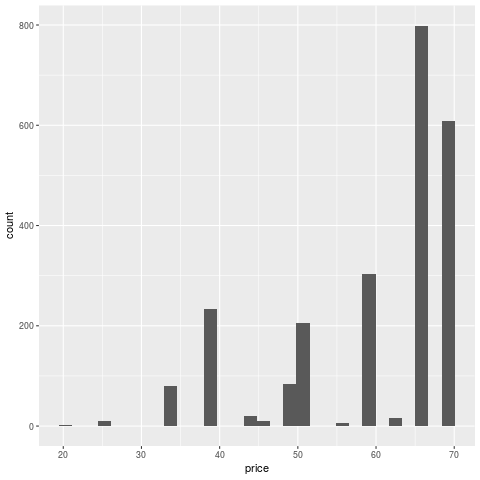

In [6]:
%%R
ggplot(aes(x=price), data = yo) + 
  geom_histogram()

In [7]:
#Move the dataframe to pandas
%R -o yo

In [8]:
yo.head()

,obs,id,time,strawberry,blueberry,pina.colada,plain,mixed.berry,price
1,1,2100081,9678,0,0,0,0,1,58.96
2,2,2100081,9697,0,0,0,0,1,58.96
3,3,2100081,9825,0,0,0,0,1,65.04
4,4,2100081,9999,0,0,0,0,1,65.04
5,5,2100081,10015,1,0,1,0,1,48.96


In [9]:
yo.describe()

,obs,time,strawberry,blueberry,pina.colada,plain,mixed.berry,price
count,2380.000000,2380.000000,2380.000000,2380.000000,2380.000000,2380.000000,2380.000000,2380.000000
mean,1367.797059,10049.668487,0.649160,0.357143,0.358403,0.217647,0.388655,59.250891
std,790.076032,227.079811,1.058612,0.819690,0.803858,0.606556,0.904311,10.913256
min,1.000000,9662.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
25%,696.500000,9843.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000
50%,1369.500000,10045.000000,0.000000,0.000000,0.000000,0.000000,0.000000,65.040000
75%,2044.250000,10255.000000,1.000000,0.000000,0.000000,0.000000,0.000000,68.960000
max,2743.000000,10459.000000,11.000000,12.000000,10.000000,6.000000,8.000000,68.960000


In [10]:
yo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2380 entries, 1 to 2380
Data columns (total 9 columns):
obs            2380 non-null int32
id             2380 non-null object
time           2380 non-null int32
strawberry     2380 non-null int32
blueberry      2380 non-null int32
pina.colada    2380 non-null int32
plain          2380 non-null int32
mixed.berry    2380 non-null int32
price          2380 non-null float64
dtypes: float64(1), int32(7), object(1)
memory usage: 120.9+ KB


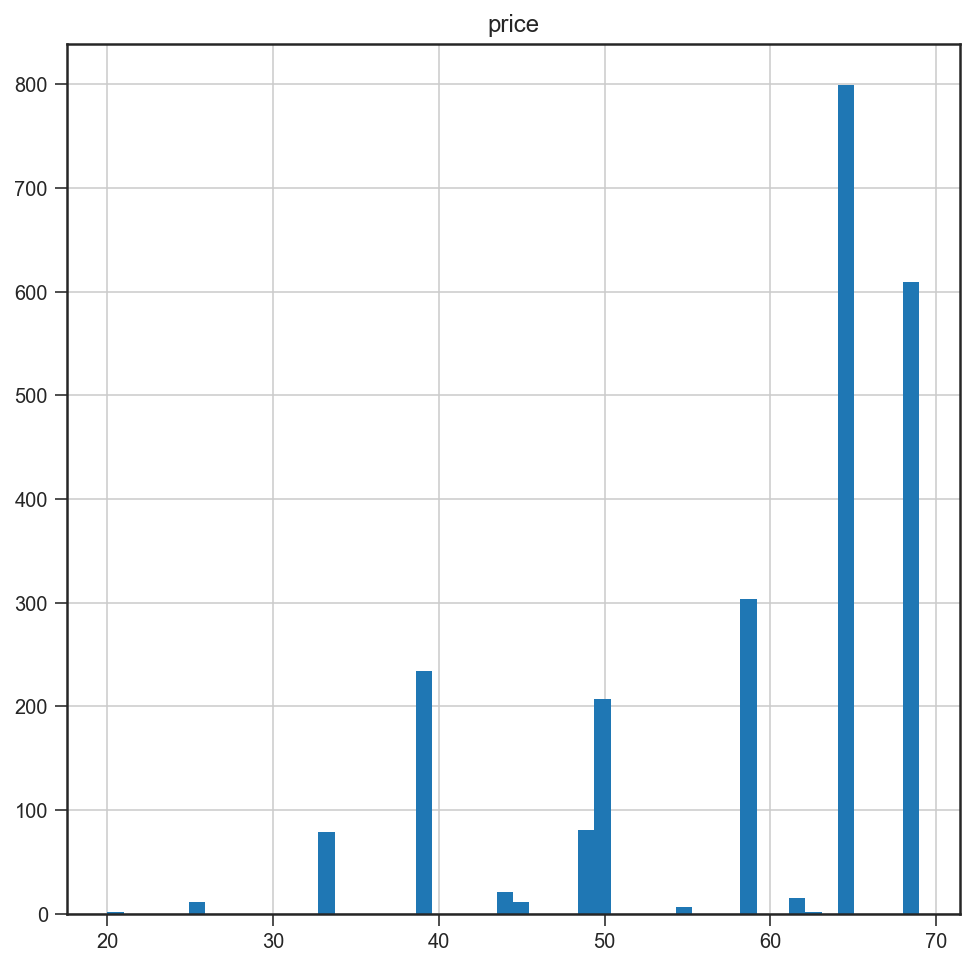

In [23]:
p = yo.hist('price', bins=50);

### Get the bin information

In [22]:
count, division = np.histogram(yo.price, bins = 50)
count,division

(array([  2,   0,   0,   0,   0,  11,   0,   0,   0,   0,   0,   0,   0,
         79,   0,   0,   0,   0,   0, 234,   0,   0,   0,   0,  21,  11,
          0,   0,   0,  81, 207,   0,   0,   0,   0,   6,   0,   0,   0,
        303,   0,   0,  15,   2,   0, 799,   0,   0,   0, 609]),
 array([ 20.    ,  20.9792,  21.9584,  22.9376,  23.9168,  24.896 ,
         25.8752,  26.8544,  27.8336,  28.8128,  29.792 ,  30.7712,
         31.7504,  32.7296,  33.7088,  34.688 ,  35.6672,  36.6464,
         37.6256,  38.6048,  39.584 ,  40.5632,  41.5424,  42.5216,
         43.5008,  44.48  ,  45.4592,  46.4384,  47.4176,  48.3968,
         49.376 ,  50.3552,  51.3344,  52.3136,  53.2928,  54.272 ,
         55.2512,  56.2304,  57.2096,  58.1888,  59.168 ,  60.1472,
         61.1264,  62.1056,  63.0848,  64.064 ,  65.0432,  66.0224,
         67.0016,  67.9808,  68.96  ]))

In [27]:
count.size, division.size

(50, 51)

In [38]:
#or this is better?
yo.price.value_counts(sort=False).sort_index()

20.00      2
24.96     11
33.04     54
33.20      1
33.28      1
33.36     22
33.52      1
39.04    234
44.00     21
45.04     11
48.96     81
49.52      1
49.60      1
50.00    205
55.04      6
58.96    303
62.00     15
63.04      2
65.04    799
68.96    609
Name: price, dtype: int64

I shouldn't have cut off the left value  
I R you could do it like this

In [42]:
%%R 

table(yo$price)


   20 24.96 33.04  33.2 33.28 33.36 33.52 39.04    44 45.04 48.96 49.52  49.6 
    2    11    54     1     1    22     1   234    21    11    81     1     1 
   50 55.04 58.96    62 63.04 65.04 68.96 
  205     6   303    15     2   799   609 


In [31]:
#Turn this into a pandas dataframe to see it better - #we have to slice the first value of division of
# (the left border of the bins bucket) tto have equally sized arrays
hist = pd.DataFrame(data={'division': division[1:],
                          'count': count
                         })
hist

,count,division
0,2,20.9792
1,0,21.9584
2,0,22.9376
3,0,23.9168
4,0,24.8960
5,11,25.8752
6,0,26.8544
7,0,27.8336
8,0,28.8128
9,0,29.7920


### Better interactive?

In [33]:
yo.price.iplot(kind='hist', subplots=True)

In [91]:
yo.nunique()

obs            2380
id              332
time            723
strawberry       12
blueberry         9
pina.colada      10
plain             7
mixed.berry       9
price            20
dtype: int64

## Number of Purchases

In [32]:
%%R
#they used factor - a funky way to make a column calculation

# let's try to get the column names progrmatically in R
columns <- names(yo)[4:8]

#one option
yo$all.purchases <- apply(yo[,c(4:8)], 1, sum)
head(yo)

  obs      id  time strawberry blueberry pina.colada plain mixed.berry price
1   1 2100081  9678          0         0           0     0           1 58.96
2   2 2100081  9697          0         0           0     0           1 58.96
3   3 2100081  9825          0         0           0     0           1 65.04
4   4 2100081  9999          0         0           0     0           1 65.04
5   5 2100081 10015          1         0           1     0           1 48.96
6   6 2100081 10029          1         0           2     0           1 65.04
  all.purchases
1             1
2             1
3             1
4             1
5             3
6             4


In [13]:
#Pandas 
yo['all_purchases'] = yo.iloc[:, 3:8].apply(np.sum, axis=1)
yo.head(6)

,obs,id,time,strawberry,blueberry,pina.colada,plain,mixed.berry,price,all_purchases
1,1,2100081,9678,0,0,0,0,1,58.96,1
2,2,2100081,9697,0,0,0,0,1,58.96,1
3,3,2100081,9825,0,0,0,0,1,65.04,1
4,4,2100081,9999,0,0,0,0,1,65.04,1
5,5,2100081,10015,1,0,1,0,1,48.96,3
6,6,2100081,10029,1,0,2,0,1,65.04,4


In [45]:
#Pandas more pythonic alternative
yo['all_purchases'] = pd.Series(sum([yo[col] for col in yo.columns[3:8]]))
yo.head(6)

,obs,id,time,strawberry,blueberry,pina.colada,plain,mixed.berry,price,all_purchases
1,1,2100081,9678,0,0,0,0,1,58.96,1
2,2,2100081,9697,0,0,0,0,1,58.96,1
3,3,2100081,9825,0,0,0,0,1,65.04,1
4,4,2100081,9999,0,0,0,0,1,65.04,1
5,5,2100081,10015,1,0,1,0,1,48.96,3
6,6,2100081,10029,1,0,2,0,1,65.04,4


### Histogram

%%R
ggplot(aes(x=all.purchases), data = yo) + geom_histogram()

In [46]:
#pandas
yo.all_purchases.value_counts().sort_index()

1     1140
2      745
3      228
4      133
5       42
6       60
7        8
8       17
9        1
10       3
11       1
12       1
21       1
Name: all_purchases, dtype: int64

In [48]:
#plotly
yo.all_purchases.iplot(kind='hist')

In [53]:
yo.iloc[:,3:].iplot(kind='hist', subplots=True)

##       Prices over Time

  Create a scatterplot of price vs time.

  This will be an example of a time series plot.

  Resolve overplotting issues by using
  techniques you learned in Lesson 4.

  What are some things that you notice?

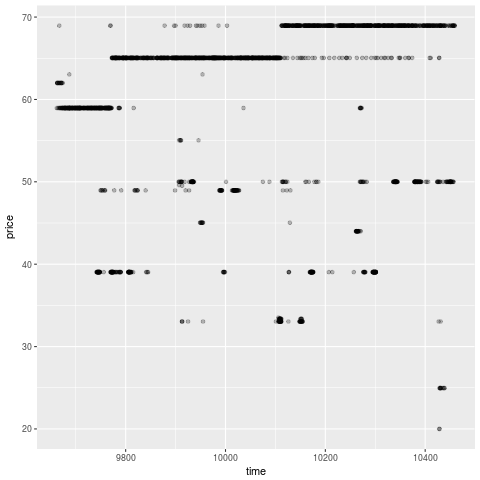

In [54]:
%%R
p <- ggplot(aes(y=price, x=time), data=yo) + 
  geom_point(alpha=1/4)
p

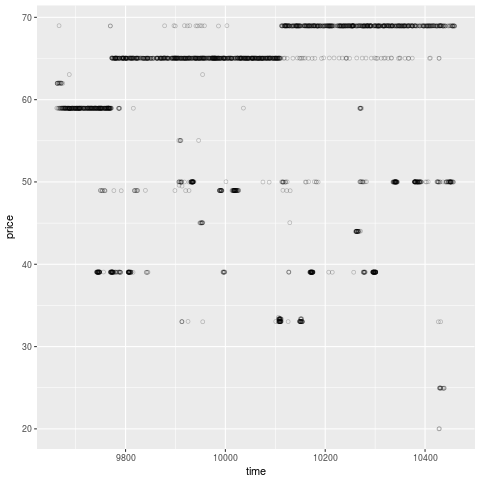

In [55]:
%%R
#Udacity's solution

p <- ggplot(aes(y=price, x=time), data=yo) + 
  geom_jitter(alpha=1/4, shape=21)
p

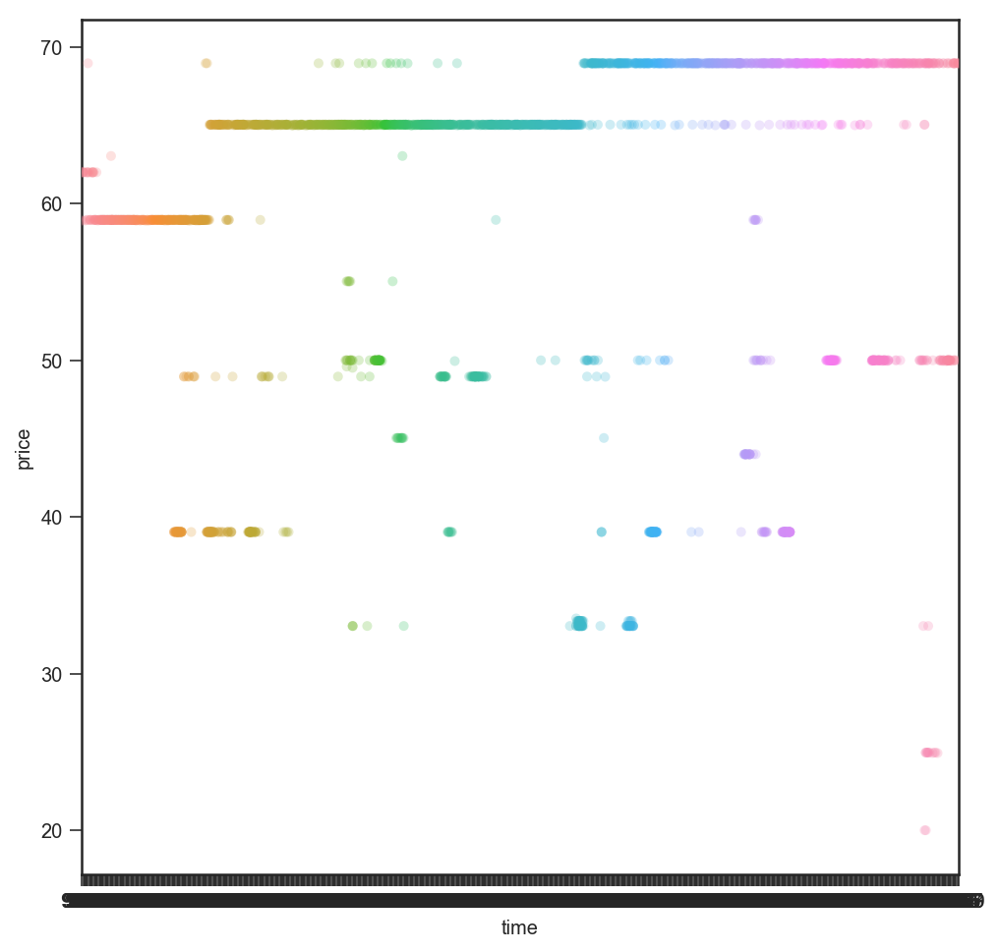

In [57]:
#pandas - seaborn
sns.stripplot(x='time', y='price', data=yo, jitter=True, alpha=1/4)

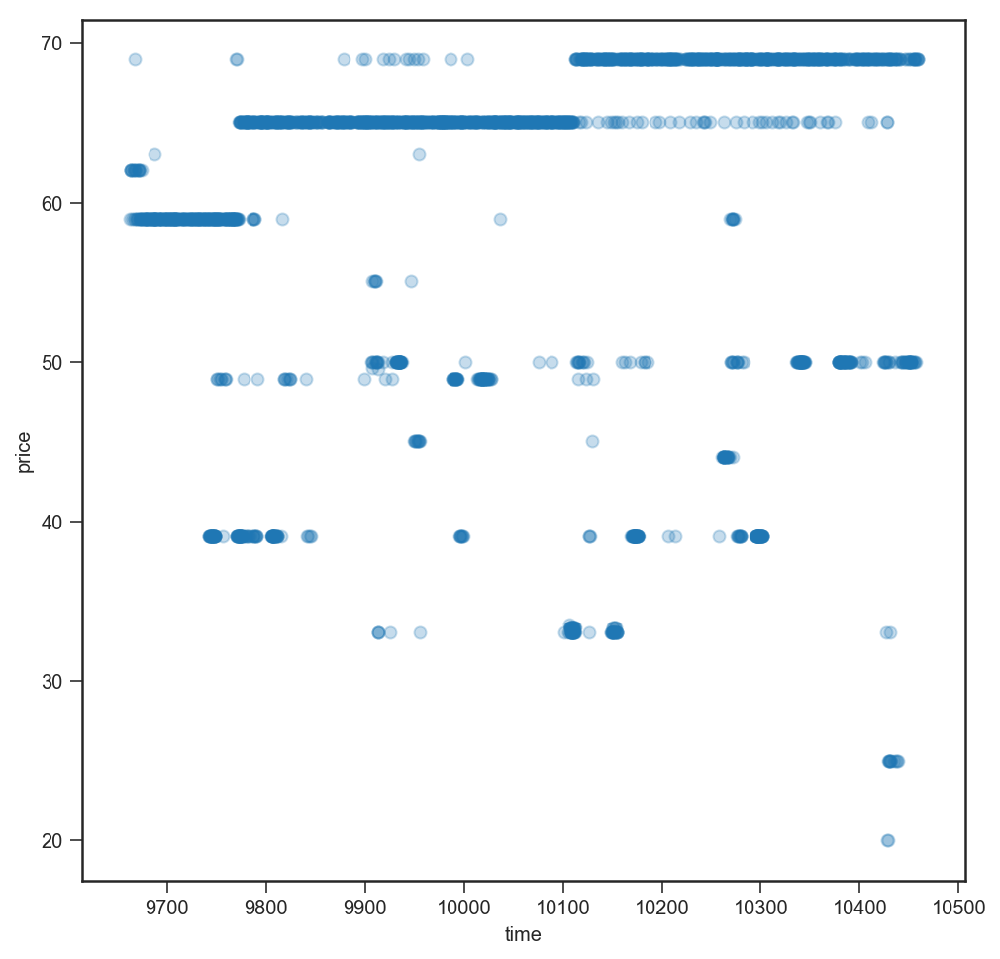

In [63]:
#pandas - seaborn
sns.regplot(x='time', y='price', data=yo, x_jitter=.1, fit_reg=False, scatter_kws={'alpha':1/4})

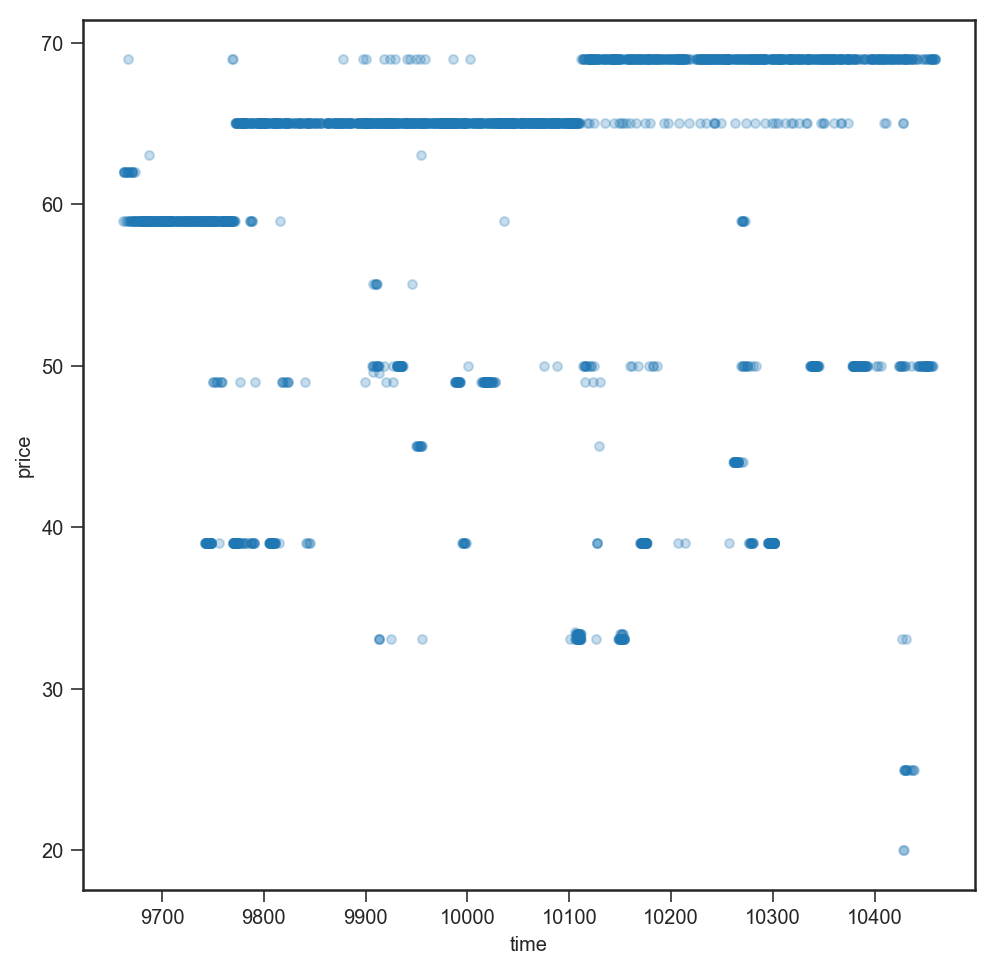

In [65]:
#pandas vanilla
yo.plot(kind='scatter', x='time', y='price', alpha=1/4);

In [73]:
#plotly
yo.iplot(kind='scatter', x='time', y='price', mode='markers+text', size=5);

## Looking at Samples of Households

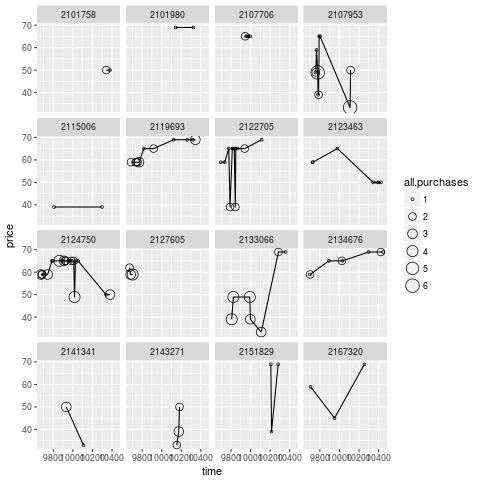

In [74]:
%%R
set.seed(4230)
sample.ids <- sample(levels(yo$id), 16)

sample.ids

ggplot(aes(x=time, y=price),
       data = subset(yo, id %in% sample.ids)) + 
       facet_wrap(~id) +
       geom_line() +
       geom_point(aes(size=all.purchases), pch=1)

In [82]:
#pandas
np.random.seed(432)

sample_ids = np.random.choice(yo.id, 16)
sample_ids
yos = yo[yo.id.isin(sample_ids)]
yos.head()

,obs,id,time,strawberry,blueberry,pina.colada,plain,mixed.berry,price,all_purchases
633,743,2115998,9685,2,2,0,0,1,58.96,5
634,744,2115998,9694,1,3,0,0,0,58.96,4
635,745,2115998,9698,0,3,0,0,0,58.96,3
636,746,2115998,9708,1,0,0,0,1,58.96,2
637,747,2115998,9729,2,4,0,0,0,58.96,6


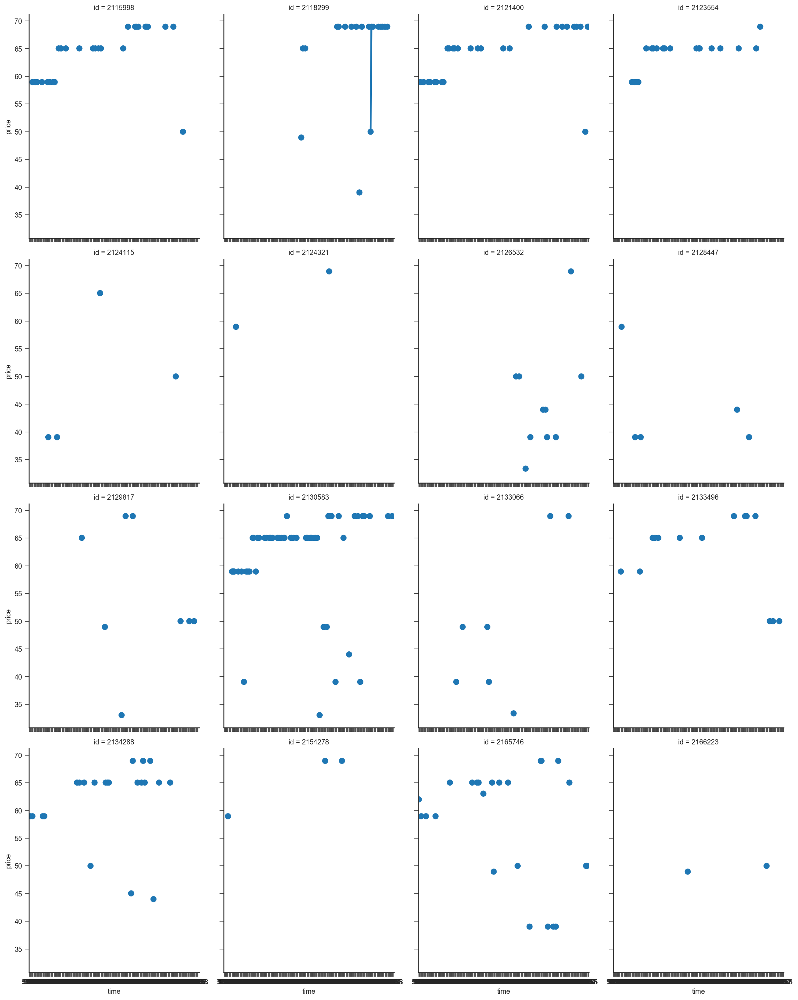

In [88]:
#factorplot
g = sns.factorplot(x="time", y='price',col_wrap=4,
                   col="id", data=yos,
                   size=5, aspect=.8)

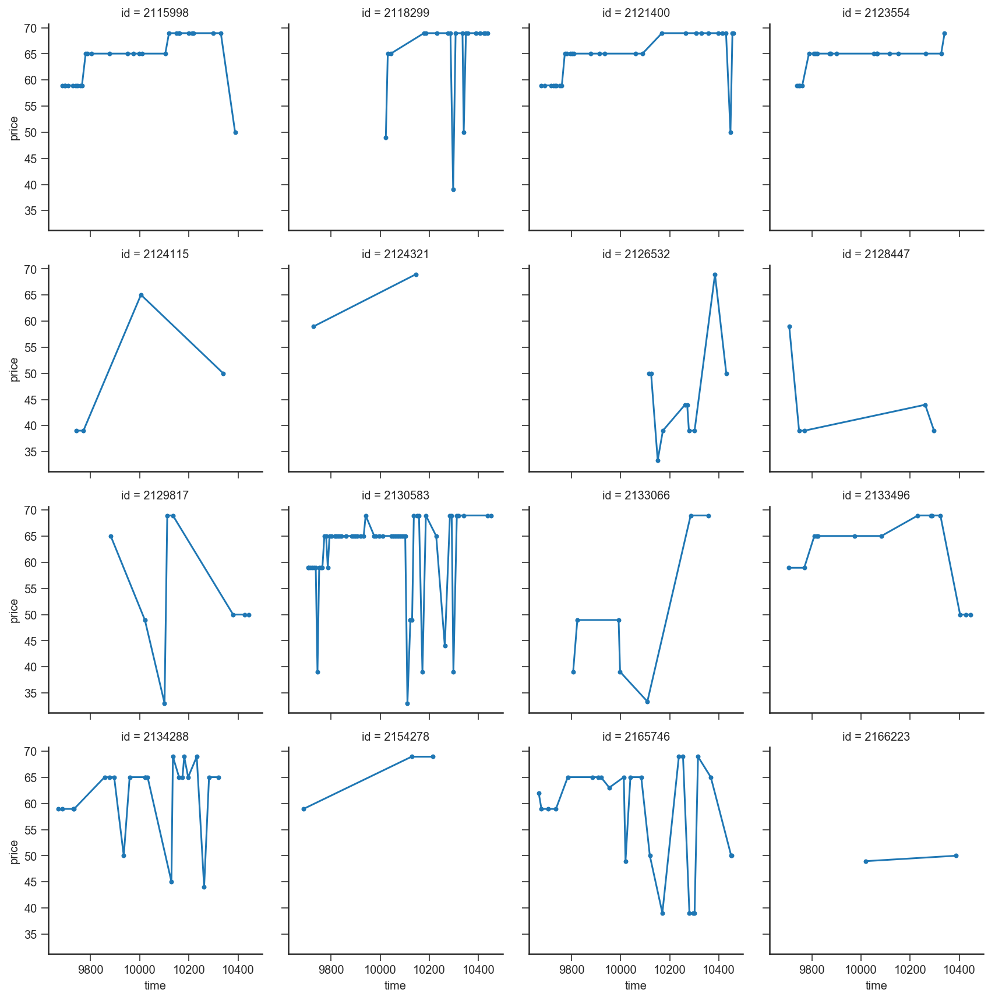

In [91]:
#facetgrid
g = sns.FacetGrid(yos, col="id", col_wrap=4, size=3)
g = g.map(plt.plot, "time", "price", marker=".")

There does not seem to be a simple solution to set the size of the dots automatically based on a variable.
Looping through the variable and assigning a value should do it. Should see if ggplot for python can do that.

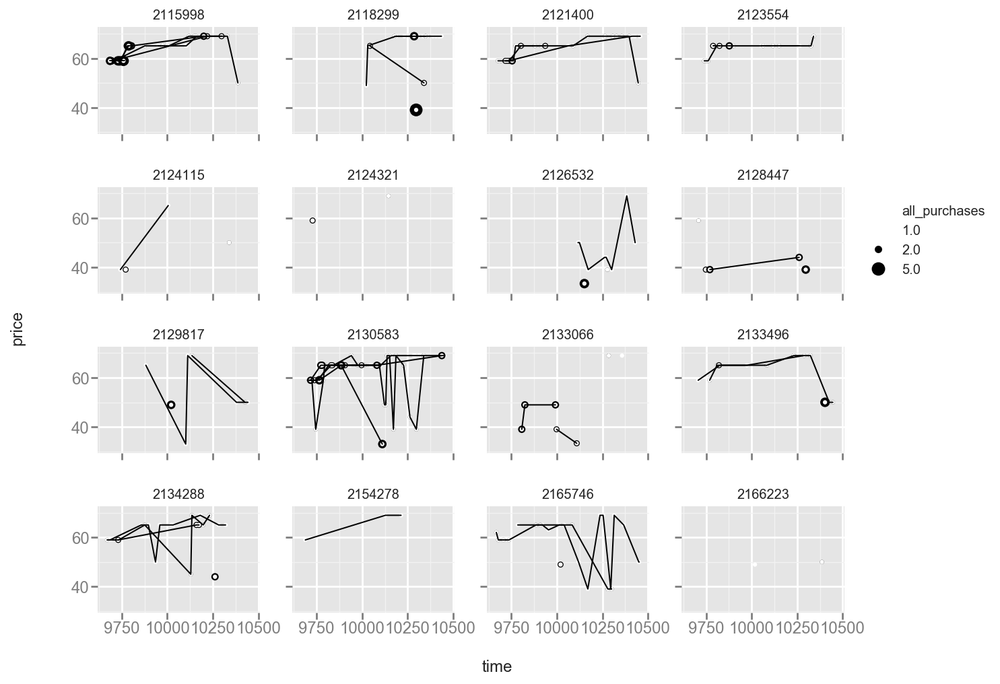

<ggplot: (8731508303971)>

In [121]:
#ggplot - got it!
ggplot(aes(x='time', y='price', size='all_purchases'), data = yos) +\
       facet_wrap('id') +\
       geom_line(size=1) +\
       geom_point(pch=1)+\
       geom_point(color='w', size=10)

## Scatterplot Matrix

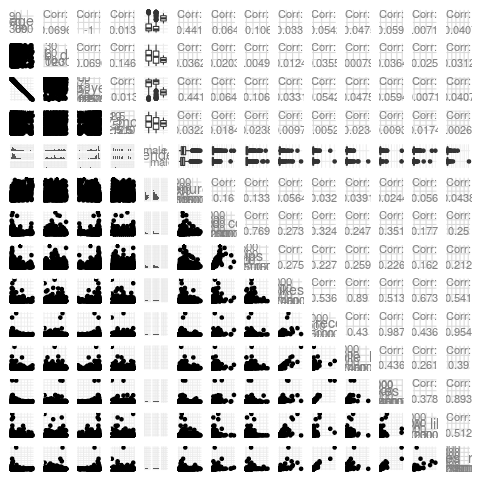

In [137]:
%%R
# install.packages('GGally', repos='http://cran.us.r-project.org')
library(GGally)
theme_set(theme_minimal(20))


#set the seed for reproducible results
set.seed(1836)

pf_subset <- pf[, c(2:15)]
names(pf_subset)
par(pin=c(12, 10))
ggpairs(pf_subset[sample.int(nrow(pf_subset), 1000), ], axisLabels = 'internal')

In [125]:
%R head(pf)

array(['function (q, df1, df2, ncp, lower.tail = TRUE, log.p = FALSE) ',
       '{', '    if (missing(ncp)) ',
       '        .Call(C_pf, q, df1, df2, lower.tail, log.p)',
       '    else .Call(C_pnf, q, df1, df2, ncp, lower.tail, log.p)', '}'],
      dtype='<U62')

In [139]:
#pandas

#set the seed for reproducible results
np.random.seed(1836)

pf_subset = pf.iloc[:,3:]
pf_subset.columns


Index(['dob_year', 'dob_month', 'gender', 'tenure', 'friend_count',
       'friendships_initiated', 'likes', 'likes_received', 'mobile_likes',
       'mobile_likes_received', 'www_likes', 'www_likes_received',
       'year_joined', 'year_joined_bucket'],
      dtype='object')

In [142]:
#generate correlation matrix
corr = pf_subset.iloc[np.random.choice(pf_subset.index, 1000),:].corr()
corr

,dob_year,dob_month,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received,year_joined
dob_year,1.000000,0.018024,-0.475002,0.035868,0.076657,0.026295,0.040006,0.068110,0.049316,-0.021296,0.032022,0.474206
dob_month,0.018024,1.000000,0.005006,-0.013681,-0.008002,-0.045085,-0.047525,-0.025576,-0.045964,-0.043723,-0.047495,0.003624
tenure,-0.475002,0.005006,1.000000,0.172793,0.115358,0.077475,0.051655,0.057120,0.050584,0.063551,0.051153,-0.974149
friend_count,0.035868,-0.013681,0.172793,1.000000,0.842358,0.409449,0.440733,0.268751,0.458838,0.364997,0.416046,-0.151875
friendships_initiated,0.076657,-0.008002,0.115358,0.842358,1.000000,0.375067,0.312272,0.299046,0.332948,0.287842,0.288902,-0.096211
likes,0.026295,-0.045085,0.077475,0.409449,0.375067,1.000000,0.735875,0.747369,0.745082,0.811379,0.710404,-0.073491
likes_received,0.040006,-0.047525,0.051655,0.440733,0.312272,0.735875,1.000000,0.243638,0.980702,0.866572,0.989216,-0.040367
mobile_likes,0.068110,-0.025576,0.057120,0.268751,0.299046,0.747369,0.243638,1.000000,0.296173,0.218039,0.198134,-0.065272
mobile_likes_received,0.049316,-0.045964,0.050584,0.458838,0.332948,0.745082,0.980702,0.296173,1.000000,0.833878,0.941491,-0.041575
www_likes,-0.021296,-0.043723,0.063551,0.364997,0.287842,0.811379,0.866572,0.218039,0.833878,1.000000,0.869191,-0.050527


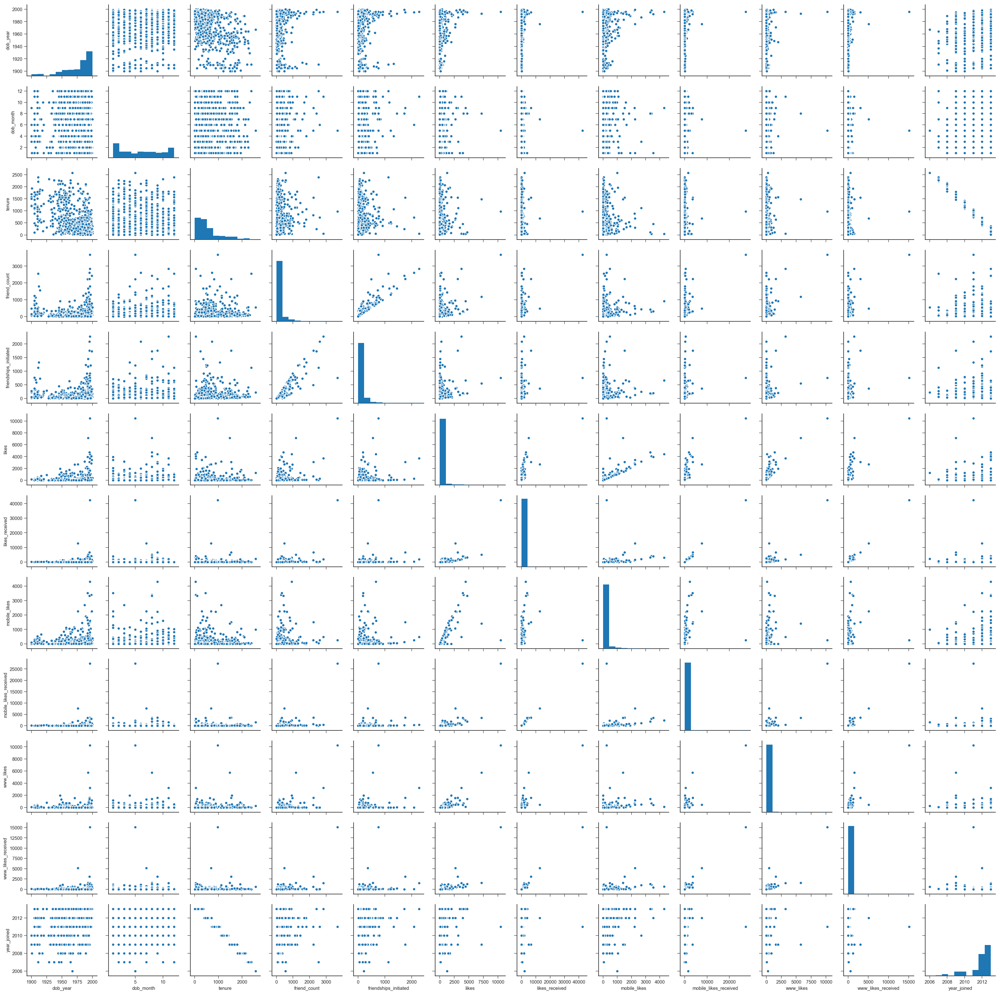

In [143]:
sns.pairplot(pf_subset.iloc[np.random.choice(pf_subset.index, 1000),:])

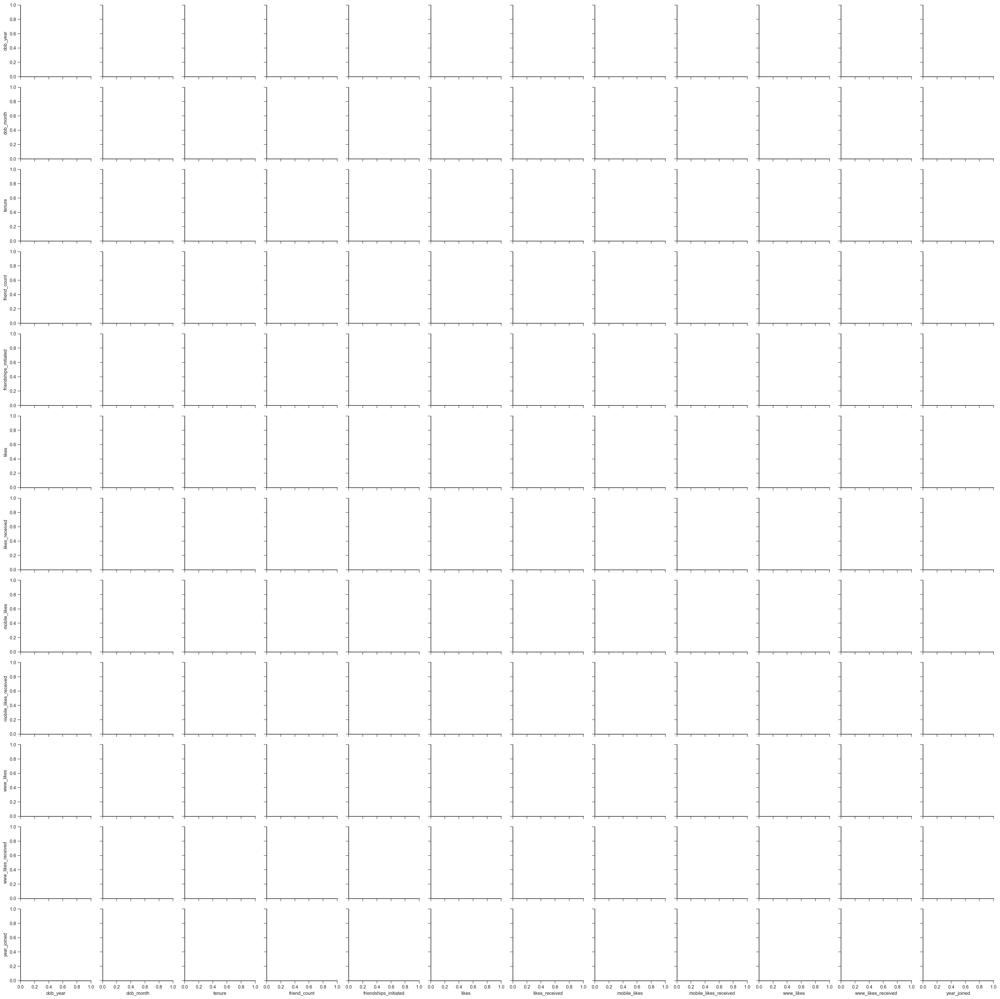

In [149]:
sns.PairGrid(pf_subset.iloc[np.random.choice(pf_subset.index, 1000),:])

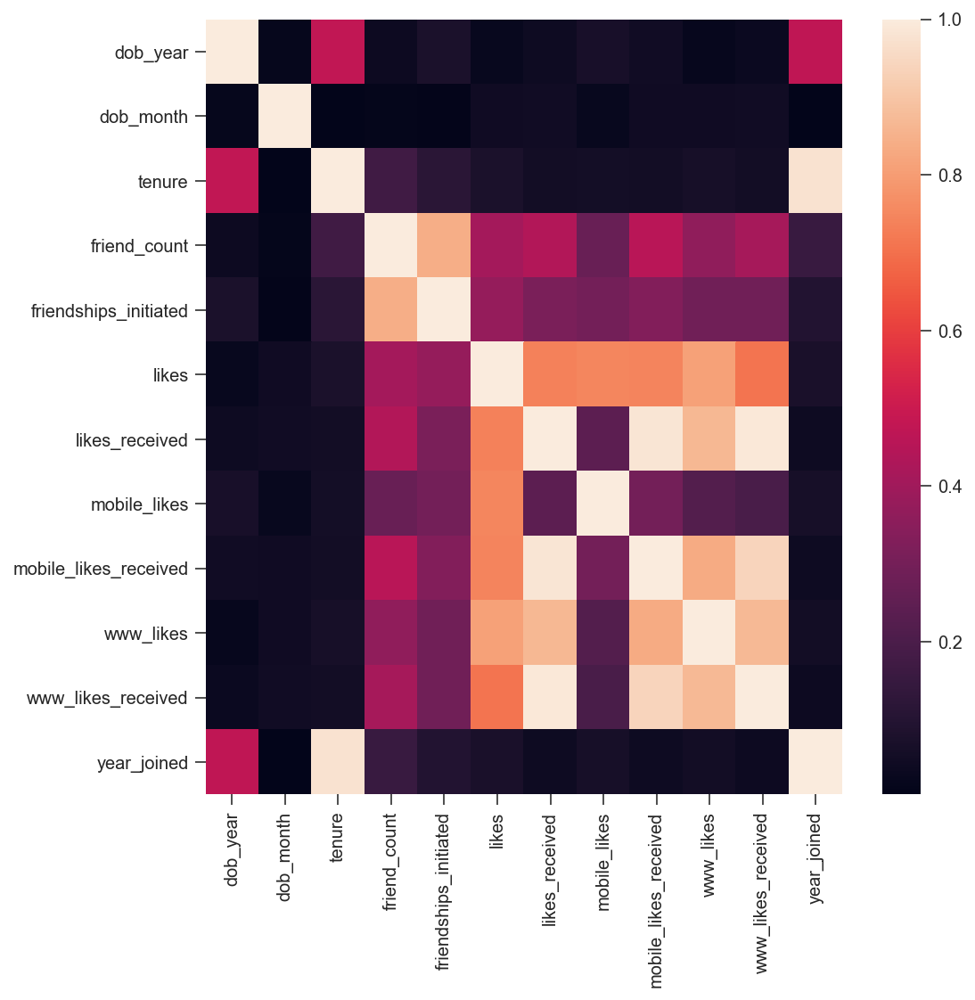

In [145]:
#heatmap with only the positive values
sns.heatmap(corr.abs())